# Wine quality prediction with machine learning #

**Q: Can we predict the quality (or customer satisfaction) of a product based on its attributes?**

As a use-case, we will consider wines:
- each wine is described in terms of acidity, residual sugar, alcohol concentration, etc.
- we can understand how the features correlate with each other and with the wine quality
- we will use Scikit-Learn to build and tune a supervised learning model

Want to see this analysis in a nice presentation? Check this website:

https://pudding.cool/2021/03/wine-model/

or have a peek here:

In [105]:
%%html
<iframe src="https://pudding.cool/2021/03/wine-model/" width="500" height="300"></iframe>

In [106]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## Read and clean the data:

In [107]:
wines = pd.read_csv('wine quality dataset.csv')

In [108]:
wines.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,NaN,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [109]:
# 1599 wines, 12 features
wines.shape

(1599, 12)

In [110]:
wines.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
volatile acidity,1595.0,0.527727,0.179135,0.12000,0.3900,0.52000,0.640000,1.58000
citric acid,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
residual sugar,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
chlorides,1597.0,0.087233,0.046126,0.01200,0.0700,0.07900,0.090000,0.61100
free sulfur dioxide,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
total sulfur dioxide,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
density,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
pH,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
sulphates,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


### Description of the dataset ###

(I am no expert so take what follows with a grain of salt)

* **volatile acidity** :   Volatile acidity is the gaseous acids present in wine.
* **fixed acidity** :   Primary fixed acids found in wine are tartaric, succinic, citric, and malic
* **residual sugar** :   Amount of sugar left after fermentation.
* **citric acid** :    It is weak organic acid, found in citrus fruits naturally.
* **chlorides** :   Amount of salt present in wine.
* **free sulfur dioxide** :   So2 is used for prevention of wine by oxidation and microbial spoilage.
* **total sulfur dioxide** 
* **pH** :   In wine pH is used for checking acidity
* **density** 
* **sulphates** :    Added sulfites preserve freshness and protect wine from oxidation, and bacteria.
* **alcohol** :   Percent of alcohol present in wine.

### Removing null values:

In [111]:
wines.isnull().sum()

fixed acidity           0
volatile acidity        4
citric acid             0
residual sugar          0
chlorides               2
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [112]:
# these are the lines that contain null values
wines.loc[wines.isnull().any(axis=1)]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
2,7.8,NaN,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
55,7.7,NaN,0.04,3.8,0.084,25.0,45.0,0.99780,3.34,0.53,9.5,5
97,7.0,NaN,0.25,2.0,0.070,3.0,22.0,0.99630,3.25,0.63,9.2,5
106,7.8,0.41,0.68,1.7,NaN,18.0,69.0,0.99730,3.08,1.31,9.3,5
139,7.8,0.56,0.19,2.0,NaN,17.0,108.0,0.99620,3.32,0.54,9.5,5
910,9.3,NaN,0.48,3.8,0.132,3.0,11.0,0.99577,3.23,0.57,13.2,6


**Q: what shall we do with null values?**

Is there a value that we can replace NaNs with that does not alter the analysis?

When in doubt: **drop**!

In [113]:
# wines.dropna(inplace=True)

In this case, if you want to replace, I would suggest to use the **mean** of that feature.

In [114]:
with_nulls = ['volatile acidity','chlorides']
wines[with_nulls].describe()

,volatile acidity,chlorides
count,1595.000000,1597.000000
mean,0.527727,0.087233
std,0.179135,0.046126
min,0.120000,0.012000
25%,0.390000,0.070000
50%,0.520000,0.079000
75%,0.640000,0.090000
max,1.580000,0.611000


In [115]:
for feature in with_nulls:
    wines.loc[wines[feature].isnull(), feature]=wines[feature].mean()

In [116]:
# let us check one of the rows that had NaNs
wines.iloc[2]

fixed acidity            7.800000
volatile acidity         0.527727
citric acid              0.040000
residual sugar           2.300000
chlorides                0.092000
free sulfur dioxide     15.000000
total sulfur dioxide    54.000000
density                  0.997000
pH                       3.260000
sulphates                0.650000
alcohol                  9.800000
quality                  5.000000
Name: 2, dtype: float64

In [117]:
# no more NaNs!
wines.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

### Standarizing:

In [118]:
# Scikit-Learn's StandardScaler takes care of standardization
# as we have seen it in the previous lectures
from sklearn.preprocessing import StandardScaler

In [119]:
# select columns that we want to standardize
all_features = [c for c in wines.columns if c!='quality']
X = wines[all_features]
# standardize
X = StandardScaler().fit_transform(X)        

In [120]:
wines[all_features] = X

In [121]:
wines.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,-0.528360,9.631973e-01,-1.391472,-0.453218,-0.243757,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246,5
1,-0.298547,1.969599e+00,-1.391472,0.043416,0.233648,0.872638,0.624363,0.028261,-0.719933,0.128950,-0.584777,5
2,-0.298547,1.862217e-15,-1.186070,-0.169427,0.103446,-0.083669,0.229047,0.134264,-0.331177,-0.048089,-0.584777,5
3,1.654856,-1.385073e+00,1.484154,-0.453218,-0.265458,0.107592,0.411500,0.664277,-0.979104,-0.461180,-0.584777,6
4,-0.528360,9.631973e-01,-1.391472,-0.453218,-0.243757,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246,5


In [122]:
wines.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

## Exploratory Analysis

Let us explore the distribution of different features and their correlation.

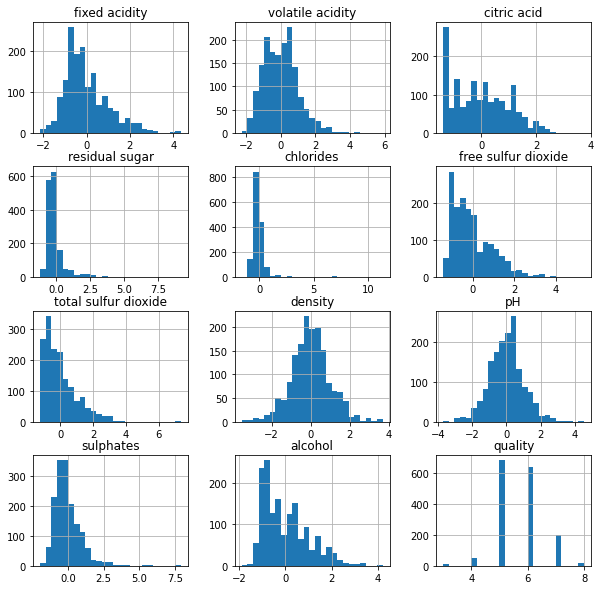

In [123]:
# compute and show the histogram for each feature 
wines.hist(bins=25,figsize=(10,10))
plt.show()

In [124]:
# seaborn is a nice plotting library
import seaborn as sns

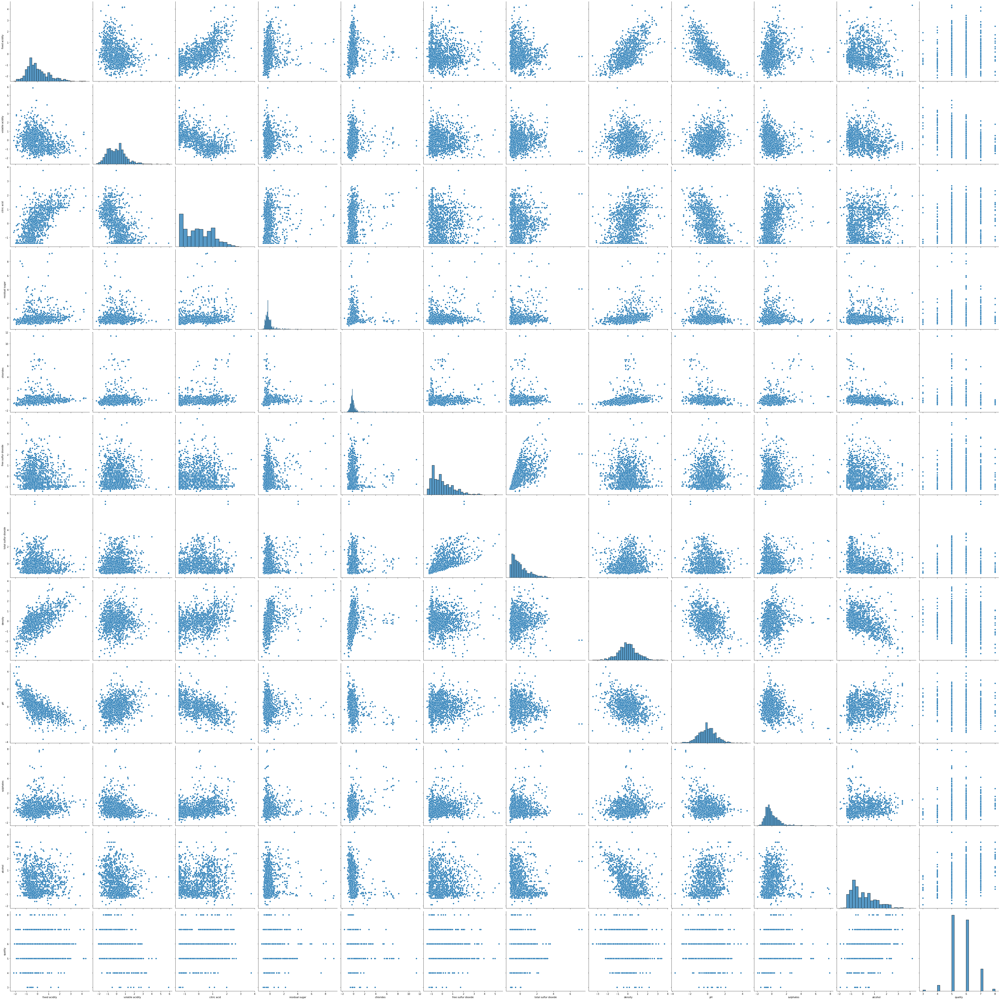

In [125]:
sns.pairplot(wines, height=5)

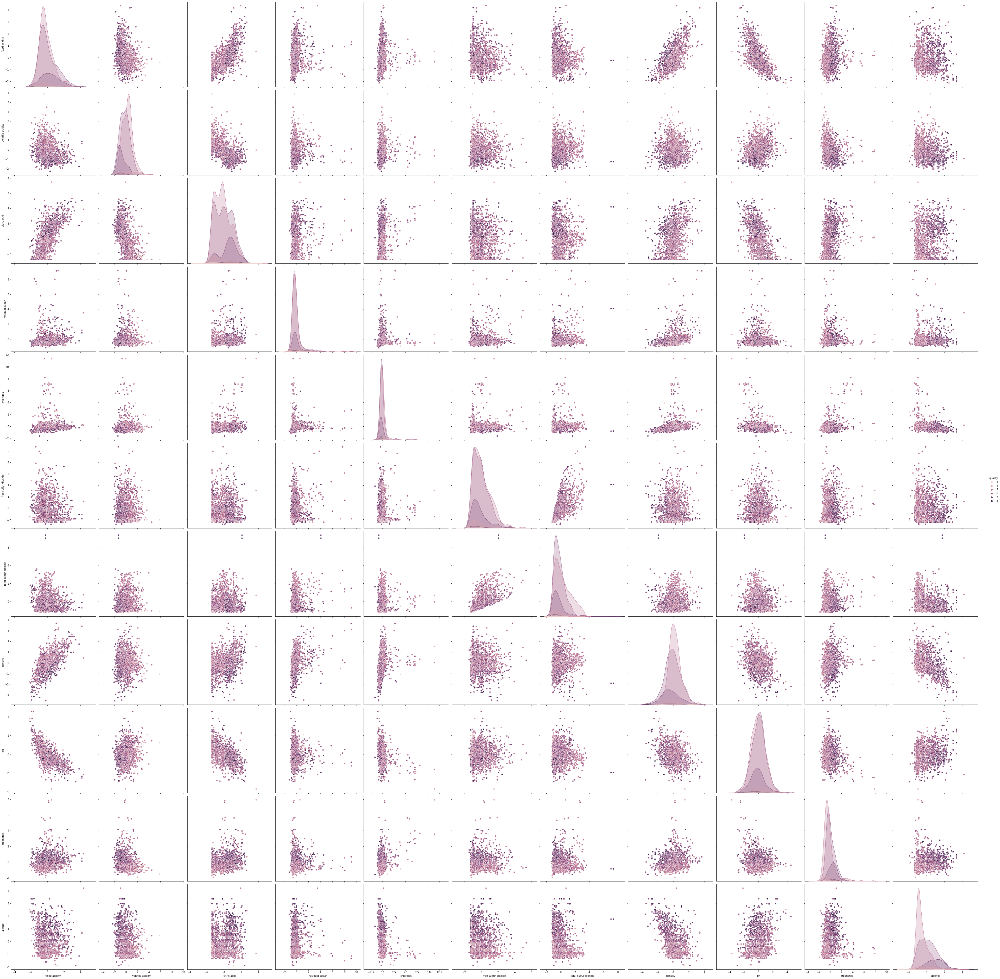

In [126]:
# different colors for different quality
sns.pairplot(wines, height=5, hue='quality')

Let us zoom onto some of these plots:

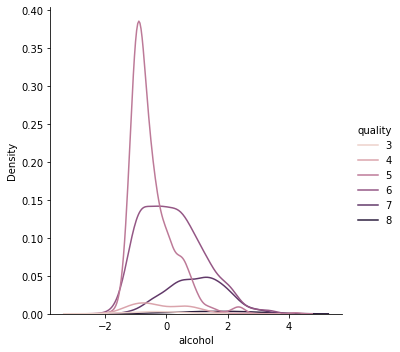

In [127]:
sns.displot(data=wines, x='alcohol', hue='quality', kind='kde')

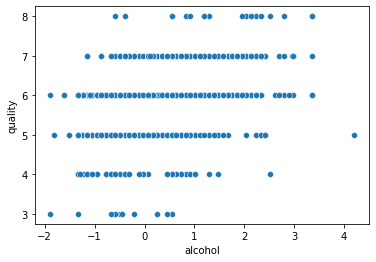

In [128]:
# same thing, different visualization
sns.scatterplot(data=wines, x="alcohol", y="quality")

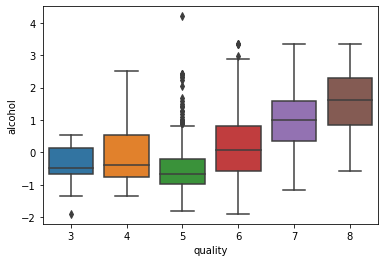

In [129]:
# same thing, different visualization
sns.boxplot(data=wines, x="quality", y="alcohol")

**Q: What do you get from this picture?**

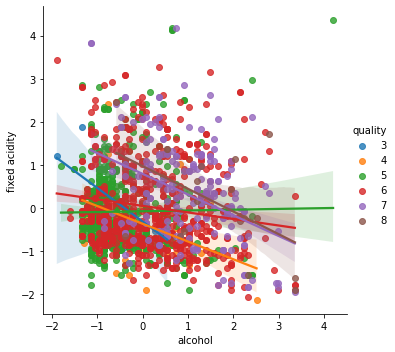

In [130]:
# visualize the correlation between two features
sns.lmplot(data=wines, x="alcohol", y="fixed acidity", hue='quality')

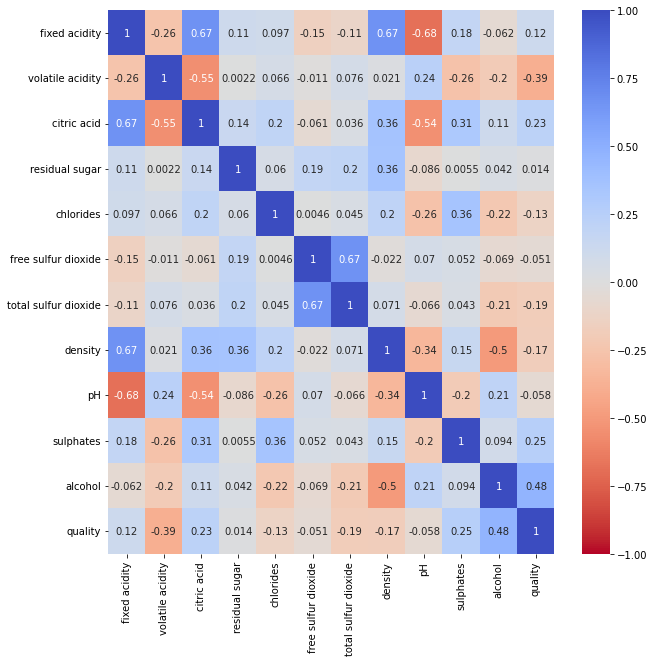

In [131]:
correlation = wines.corr()
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(correlation, cmap='coolwarm_r', vmin=-1, vmax=1, annot=True, ax=ax)

### Exercises ###

#### Q1: What level of acidity (pH value) receives the highest average rating?

#### Q2: Do wines with higher alcoholic content receive better ratings?

#### Q3: Do sweeter wines (more residual sugar) receive better ratings?


# Machine Learning

Machine learning consists in teaching a computer how to **learn** from **data** to take **decisions** or make **predictions**.

Originally it consisted of expliciting a set of **rules** that the computer had to follow, but now it works by defining algorithms that allow the computer to learn to **identify patterns**.

At a high level, you can distinguish between:

### Supervised Learning ###
The computer is given a set of **labeled** data and it learns how to label **new data**.

For instance, your email provider uses emails that you or other users labeled as spam to learn how to automatically detect spam.

### Unsupervised Learning ###
The computer is given **unlabeled** data and it must identify patterns and statistical differences between subsets of data points.

For instance, the spatial clustering algorithms we used in previous lectures to classify the customers of a retail store are an example of an unsupervised classification algorithm.

In the following, we will **not** review the general principles of machine learning, but rather see supervised learning in action, relying on functions provided by Scikit-Learn, Python's premier general-purpose machine learning library (check Lecture 1 for more details).

### Regression vs. Classification

- a **regression** algorithm is used to predict a label that takes on a **continuous value** (e.g., price, salary, age, etc.);
- a **classification** algorithm, instead, is used to predict a **discrete label** from a finite set of possible classes (e.g., true or false, good or bad, numbers from 0 to 9, etc.).

## Regression algorithms ##

A regression algorithm basically searches for a **function** of the data features that can be used to compute a **good approximation** of the target variable.

The simplest case is **linear regression**, that assumes that the target variable is a linear combination of the features. 

![a regression algorithm](regression.gif)

### Loss functions ###

In the above picture, the regression line is updated trying to **minimize** the **mean squared error (MSE)**.

The MSE is a well-known example of a **loss function**, that is, a function that can be used to map an event or values of one or more variables onto a real number intuitively representing some **cost** associated with the event.

When you **train** a supervised learning model, the computer tries to learn the best possible model (of the chosen type) by trying to find the combination of **parameters** that **minimizes** the specified loss function.

The loss function is generally obtained summing the **errors** that your current prediction makes when compared with the observed values, i.e., how **far** you prediction is from the training data.

![a decision tree](regression_error.png)

The **MSE** is defined as the average of the summation of the squared difference between the actual output value and the predicted output value.

![a decision tree](MSE.webp)

For example, if we the observed values are (3,5,7,9) and the predicted values are (4,5,7,7), then the MSE is:

((3-4)² + (5-5)² + (7-7)² +(9-7)²)/4 = (1+0+0+4)/4 = 5/4 = 1.25

### Decision Trees ###

Another family of algorithms that is widely used in machine learning are **Decision Trees**.
These algorithms branch like trees starting with the root of the tree and following splits based on variable outcomes until a leaf node is reached and the result is given.

For instance:

![a decision tree](decision_tree.png)

### Ensemble learning ###

**Ensemble learning** is the process of using **multiple** models, trained over the same data, averaging the results of each model, ultimately finding a more powerful predictive/classification result.

Ensemble learning works when the errors of each model are independent and different from model to model.

### Bootstrapping ###

**Bootstrapping** is the process of **randomly sampling** subsets of a dataset over a given number of iterations and a given number of variables.
These results are then averaged together to obtain a more powerful result.
Bootstrapping is an example of an applied ensemble model.

### Random Forests ###

A **Random Forest** combines bootstrapping and ensemble learning, using decision trees as the underlying algorithm.
In practice, it creates **multiple randomly drawn decision trees** from the data, averaging the results to output a new result that often leads to strong predictions/classifications.

We will use the sklearn module for training a random forest regression model, specifically the **RandomForestRegressor** function.
`RandomForestRegressor` is a model **family**.
This means that what we will import is the definition of broad type of models.
Within each family of models, you get an actual model after you **fit** and **tune** its parameters to the data.

A machine learning model has two types of parameters:
- the **parameters** can be learned directly from the data (i.e., regression coefficients)
- the **hyperparameters** express "higher-level" structural information about the model, and they are typically set before training the model.

For example, in a random forest regression:
- within each decision tree, the computer can empirically decide **where** to create branches, so the actual branch locations are model parameters;
- however, the algorithm does **not** know which criterion must be used to select the branch location, or how many trees to include in the forest, so these are hyperparameters that the user must set.

Sklearn's `RandomForestRegressor` has many different hyperparameters, the most important being:
- `n_estimators`, the number of decision trees you will be running in the model
- `criterion`, the criterion (or **loss function**) used to determine model outcomes
- `max_depth`, the maximum possible depth of each tree
- `max_features`, the maximum number of features the model will consider when determining a split
    


## Use case: wine quality prediction ##

In [132]:
# Import libraries and modules
import numpy as np
import pandas as pd

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn import preprocessing
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

Notes:

`make_pipeline` and `GridSearchCV` will be needed to perform **cross-validation**.

`mean_squared_error` and `r2_score` are two functions needed to evaluate our model performance.


In [133]:
# Load red wine data (again).
dataset_url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv'
data = pd.read_csv(dataset_url, sep=';')

### Approch 1: linear regression ###

In the exploratory data analysis we have seen that the alcohol content is the variable having the strongest correlation with the target variable (quality).

Let us visualize this relation:

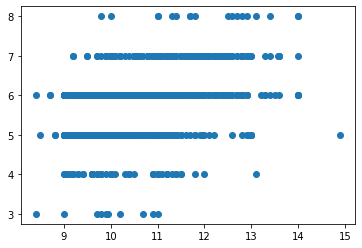

In [134]:
import matplotlib.pyplot as plt

plt.scatter(data.alcohol, data.quality)

We can easily fit a linear regression to these data:

In [135]:
X = data.alcohol.to_numpy().reshape(-1,1)
y = data.quality.to_numpy()
reg = LinearRegression().fit(X, y)

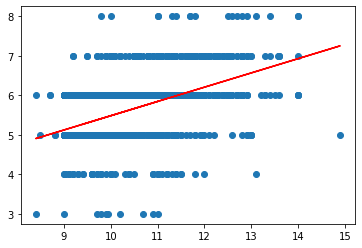

In [136]:
plt.scatter(data.alcohol, data.quality)
plt.plot(X, reg.intercept_+reg.coef_*X, color='r')

(Almost) the same result can be obtained with a one-liner:

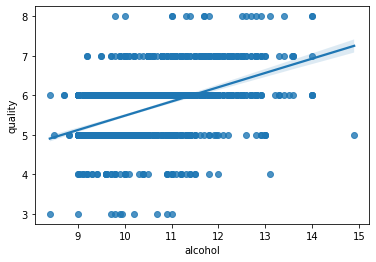

In [137]:
import seaborn as sns

sns.regplot(data=data, x='alcohol', y='quality')

**Q**: Can you spot the difference?

The translucent area is a **confidence interval** that seaborn estimates using a bootstrap procedure.

We can apply a similar procedure to introduce the concept of **cross-validation**.

### Cross-validation ###

Cross-validation helps you **maximize model performance** while **reducing the chance of overfitting**.

Glossary:
- **Overfitting** occurs when your output model corresponds too closely or exactly to the training data and may therefore fail to fit to additional data or predict future observations reliably. An overfitted model contains more parameters than can be justified by the data because it has unknowingly extracted some of the "noise" as if it was part of the underlying structure of the data. Example: fitting a non-linear model to linear data.
- **Underfitting** occurs when a your output model cannot adequately capture the underlying structure of the data because it misses some parameters or terms that would appear in a correctly specified model. Example: fitting a linear model to non-linear data. 

To avoid both under- and overfitting, cross-validation trains and evaluates the model multiple times using the **same method**, but **different subsets of data**:

In particular, so-called **K-fold** cross-validation works like this:
1. Split your data into K equal parts, or "folds" (typically K=10).
2. Train your model on K-1 folds (e.g., the first 9 folds).
3. Evaluate it on the remaining "hold-out" fold (e.g., the 10th fold).
4. Perform steps 2. and 3. K times, each time holding out a different fold.
5. Aggregate the performance across all K folds. This is your performance metric.
    
![cross validation](cross_validation.jpg)

In [138]:
X = data['alcohol'].to_numpy().reshape(-1,1)
y = data['quality'].to_numpy()

#define cross-validation method to use
cv = KFold(n_splits=10, random_state=1, shuffle=True)

#build multiple linear regression model
model = LinearRegression()

#use k-fold CV to evaluate model
scores = cross_val_score(model, X, y, scoring='neg_mean_squared_error',
                         cv=cv, n_jobs=-1)

#view errors for all holdouts
scores

array([-0.38169509, -0.52467825, -0.53013385, -0.50341413, -0.46066765,
       -0.52319014, -0.53583492, -0.43560462, -0.60138558, -0.55100049])

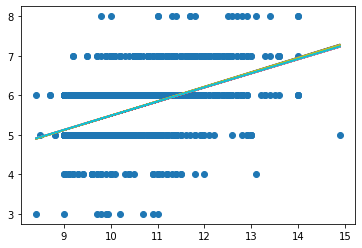

In [139]:
# out of curiosity, let us plot the model obtained for different splits 
plt.scatter(X, y)
for train_index, test_index in cv.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    reg = LinearRegression().fit(X_train, y_train)  
    plt.plot(X, reg.intercept_+reg.coef_*X)

### Approach 2: random forest regression ###

We now implement a more complex regression algorithm that considers all the available features.

First, we set the wine `quality` as our target variable `y` and we set aside 20% of the data as a **test set** for evaluating our model.
We also set an arbitrary "random state" (a.k.a. seed) so that we can reproduce our results.

Note that dividing your data into a train and test set is **not** like K-fold splitting:
- train/test splitting is meant for model evaluation: once the model has been fit to the training data, we use the test data to check the performance of the algorithm
- K-fold splitting is meant for cross-validation: the training data will be further split in order to tune the hyperparameters of the model

In [140]:
# Split data into training and test sets
y = data.quality
X = data.drop('quality', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    random_state=123, 
                                                    stratify=y)

Instead of directly invoking the scale function, we include the scaling function into a pipeline together with the classification model.

The general idea is that you can define a **Transformer**, that is a type of preprocessing step that you want to apply to the data, and this general transformation is "fit" using the training data and then used in the very same way on future data sets for which you want to use your classification model.

In practice, we will:
- Fit the transformer on the training set (saving the means and standard deviations)
- Apply the transformer to the training set (scaling the training data)
- Apply the transformer to the test set (using the same means and standard deviations)

This makes your final estimate of model performance more realistic, and it allows to insert your preprocessing steps into a cross-validation pipeline.

Notice that this means that the scaled features in the test set will **not** be perfectly centered at zero with unit variance, because these data will be rescaled using the means from the training set, not from the test set itself.

In [141]:
# Declare data preprocessing steps
pipeline = make_pipeline(preprocessing.StandardScaler(),
                         RandomForestRegressor(n_estimators=100,
                                               random_state=123))

`pipeline` now is a modeling pipeline that first transforms the data using `StandardScaler()` and then fits a model using a random forest regressor.

**Q:** Why is cross-validation important in machine learning?

For a random forest regressor, one of the main hyperparameters is the **maximum depth** allowed for each decision tree in your forest.

**Q:** How can you decide how to set this hyperparameter?

Using your **training set only**, you can use cross-validation to evaluate different hyperparameters and estimate their effectiveness.

The test set stays "untouched" and is **never** used in the process of tuning hyperparameters and can be safely used for tuning the parameter and select the actual model from the family.

In [142]:
# Declare hyperparameters to tune
hyperparameters = { 'randomforestregressor__max_features' : ['auto', 'sqrt', 'log2'],
                  'randomforestregressor__max_depth': [None, 5, 3, 1]}

`GridSearchCV` performs an exhaustive search over the specified parameter values, implementing cross-validation across all possible permutations of those hyperparameters.

![grid search](grid_search_workflow.png)

`GridSearchCV` takes in your model, the hyperparameters you want to tune, and the number of folds to create.

In [143]:
# Tune model using cross-validation pipeline
clf = GridSearchCV(pipeline, hyperparameters, cv=10)
 
clf.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('randomforestregressor',
                                        RandomForestRegressor(random_state=123))]),
             param_grid={'randomforestregressor__max_depth': [None, 5, 3, 1],
                         'randomforestregressor__max_features': ['auto', 'sqrt',
                                                                 'log2']})

The best hyperparameters are:

In [144]:
print(clf.best_params_)

{'randomforestregressor__max_depth': None, 'randomforestregressor__max_features': 'sqrt'}


Now we fit the model again, with the best hyperparameters, on the **entire training set**.

Conveniently, `GridSearchCV` from sklearn will automatically refit the model with the best set of hyperparameters using the entire training set, so the following step is not strictly required.

In [145]:
pipeline = make_pipeline(preprocessing.StandardScaler(),
                         RandomForestRegressor(n_estimators=100,
                                               random_state=123,
                                               max_depth=None,
                                               max_features='sqrt'))
clf = pipeline.fit(X_train, y_train) #randomforestregressor__max_depth=None, max_features='sqrt')

Finally, we can **evaluate** the model!

We **predict** the `quality` of the wines we left out as test data and we **check** the predictions against the observations:

In [146]:
# Evaluate model pipeline on test data
pred = clf.predict(X_test)
print( r2_score(y_test, pred) )
print( mean_squared_error(y_test, pred) )

0.4712595193413647
0.34118218749999996


**Q:** Are these values **good enough**?

There is **no** general rule to answer this question:
- If the model is tied to a business problem, the first thing you want to do is check whether these predictions are good enough to solved the problem.
- Look in academic literature to get a sense of the current performance benchmarks for specific types of data.
    Try to find low-hanging fruit in terms of ways to improve your model.

There are various ways to improve a model. We’ll have more guides that go into detail about how to improve model performance, but here are a few quick things to try:

    Try other regression model families (e.g. regularized regression, boosted trees, etc.).
    Collect more data if it’s cheap to do so.
    Engineer smarter features after spending more time on exploratory analysis.
    Speak to a domain expert to get more context (…this is a good excuse to go wine tasting!).

As a final note, when you try other families of models, we recommend using the same training and test set as you used to fit the random forest model. That’s the best way to get a true apples-to-apples comparison between your models.

In [147]:
# Save model for future use
import pickle

with open('rf_regressor.pickle', 'wb') as f:
    pickle.dump(clf, f)

## Classification algorithms ##

A **classification** algorithm tries to assign each data entry to one of a finite sets of classes.

Evaluating the performance of a classification algorithm is generally easier because you either get the right or the wrong class.

A special case of classification is so-called **binary classification**, which happens when we only have 2 classes.
This makes the evaluation of the quality of the predictions especially simple:

![measures for binary classifiers](classifier_metrics.png)

The **F1 score** is the **harmonic mean** of precision and recall:

    F1 = 2*precision*recall/(precision+recall)

## Use case: Wine quality prediction (again) ##

We use **one hot encoding** to tell apart good and bad wines.

In [1]:
data['good quality'] = [1 if x>6 else 0 for x in data['quality']]

NameError: name 'data' is not defined

In [2]:
data.head()

NameError: name 'data' is not defined

We distinguish feature variables and target variables:

In [7]:
X = data.drop(['quality', 'good quality'], axis = 'columns')

In [8]:
Y = data['good quality']

In [9]:
# check how many good and bad wines we have in the dataset
Y.value_counts()

0    1382
1     217
Name: good quality, dtype: int64

We now split the data into train and test data.

In [10]:
from sklearn.model_selection import train_test_split

In [11]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.2, random_state = 40)

Now we compare and evaluate 2 classification algorithms.

### Decision Tree Classifier ###

In [47]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn import preprocessing
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier 

In [31]:
# Declare data preprocessing steps
dtc = make_pipeline(preprocessing.StandardScaler(),
                         DecisionTreeClassifier(random_state = 40))

In [33]:
# Declare hyperparameters to tune
hyperparameters = { 'decisiontreeclassifier__max_features' : ['auto', 'sqrt', 'log2'],
                  'decisiontreeclassifier__max_depth': [None, 5, 3, 1]}

In [35]:
# Tune model using cross-validation pipeline
dtc_clf = GridSearchCV(dtc, hyperparameters, cv=10)
 
dtc_clf.fit(X_train, Y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('decisiontreeclassifier',
                                        DecisionTreeClassifier(random_state=40))]),
             param_grid={'decisiontreeclassifier__max_depth': [None, 5, 3, 1],
                         'decisiontreeclassifier__max_features': ['auto',
                                                                  'sqrt',
                                                                  'log2']})

In [36]:
print(dtc_clf.best_params_)

{'decisiontreeclassifier__max_depth': 5, 'decisiontreeclassifier__max_features': 'auto'}


In [37]:
dtc_clf = make_pipeline(preprocessing.StandardScaler(),
                         DecisionTreeClassifier(random_state = 40,
                                               max_depth=5,
                                               max_features='auto'))
dtc_clf.fit(X_train, Y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('decisiontreeclassifier',
                 DecisionTreeClassifier(max_depth=5, max_features='auto',
                                        random_state=40))])

In [95]:
# check score on train data
# this is the mean accuracy on the given test data and labels
# for binary classifiers this is the proportion of data entries
# for which the classifier predicts the correct label
dtc_clf.score(X_train, Y_train)

0.910086004691165

In [93]:
# check score on test data
dtc_clf.score(X_test,Y_test)

0.865625

In [41]:
pred_dtc = dtc_clf.predict(X_test)

In [42]:
pred_dtc[:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

Let us visualize a report of the obtained classification.

In [45]:
from sklearn.metrics import classification_report

print(classification_report(Y_test, pred_dtc))

              precision    recall  f1-score   support

           0       0.90      0.95      0.92       272
           1       0.58      0.38      0.46        48

    accuracy                           0.87       320
   macro avg       0.74      0.66      0.69       320
weighted avg       0.85      0.87      0.85       320



### Random Forest Classifier ###

In [48]:
# Declare data preprocessing steps
rfc = make_pipeline(preprocessing.StandardScaler(),
                         RandomForestClassifier(random_state = 40))

In [51]:
# Declare hyperparameters to tune
hyperparameters = { 'randomforestclassifier__max_features' : ['auto', 'sqrt', 'log2'],
                  'randomforestclassifier__max_depth': [None, 5, 3, 1]}

In [52]:
# Tune model using cross-validation pipeline
rfc_clf = GridSearchCV(rfc, hyperparameters, cv=10)
 
rfc_clf.fit(X_train, Y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(random_state=40))]),
             param_grid={'randomforestclassifier__max_depth': [None, 5, 3, 1],
                         'randomforestclassifier__max_features': ['auto',
                                                                  'sqrt',
                                                                  'log2']})

In [53]:
print(rfc_clf.best_params_)

{'randomforestclassifier__max_depth': None, 'randomforestclassifier__max_features': 'auto'}


In [54]:
rfc_clf = make_pipeline(preprocessing.StandardScaler(),
                         RandomForestClassifier(random_state = 40,
                                               max_depth=None,
                                               max_features='auto'))
rfc_clf.fit(X_train, Y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(random_state=40))])

In [55]:
# check score on train data
rfc_clf.score(X_train, Y_train)

1.0

In [56]:
# check score on test data
rfc_clf.score(X_test,Y_test)

0.9

In [57]:
pred_rfc = rfc_clf.predict(X_test)

In [58]:
pred_rfc[:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [62]:
# created new dataframe with classification results
results = pd.DataFrame({'rfc':pred_rfc, 'dtc':pred_dtc})

In [63]:
results.head()

,rfc,dtc
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


Let us visualize a report of the obtained classification.

In [64]:
from sklearn.metrics import classification_report

print(classification_report(Y_test, pred_rfc))

              precision    recall  f1-score   support

           0       0.92      0.97      0.94       272
           1       0.75      0.50      0.60        48

    accuracy                           0.90       320
   macro avg       0.83      0.74      0.77       320
weighted avg       0.89      0.90      0.89       320



### Confusion matrix ###

The confusion matrix shows how predicted values differ from gold truth.

In [65]:
from sklearn.metrics import confusion_matrix

In [66]:
import seaborn as sn

In [67]:
cm_dtc = confusion_matrix(Y_test, pred_dtc)

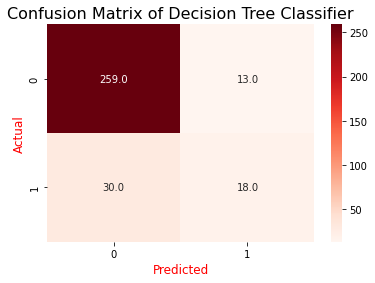

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.heatmap(cm_dtc, annot=True, cmap='Reds', fmt="0.1f")
plt.title('Confusion Matrix of Decision Tree Classifier', fontsize = 16)
plt.xlabel('Predicted', fontsize = 12, color = 'r')
plt.ylabel('Actual', fontsize = 12, color = 'r')
plt.show()

In [70]:
cm_rfc = confusion_matrix(Y_test, pred_rfc)

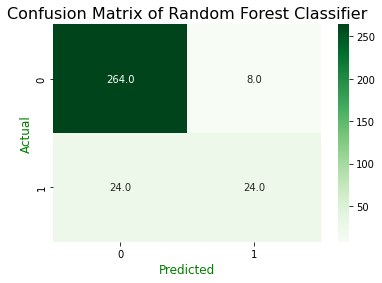

In [72]:
sns.heatmap(cm_rfc, annot=True, cmap='Greens', fmt="0.1f")
plt.title('Confusion Matrix of Random Forest Classifier', fontsize = 16)
plt.xlabel('Predicted', fontsize = 12, color = 'g')
plt.ylabel('Actual', fontsize = 12, color = 'g')
plt.show()

### ROC curve ###

The **ROC** curve (**receiver operating characteristic**) is a graphical way to visualize the quality of a **binary** classifier as its discrimination threshold is varied.

The ROC curve is created by plotting the true positive rate (TPR) against the false positive rate (FPR) at various threshold settings.

The **AUC** (**area under the curve**) measures the probability that, when given one randomly selected instance from both classes, the classifier will be able to tell which one is which.

In [73]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [74]:
probs_dtc = dtc_clf.predict_proba(X_test)

In [75]:
probs_dtc = probs_dtc[:,1]

In [77]:
auc_dtc = roc_auc_score(Y_test, probs_dtc)
print(auc_dtc)

0.8072533700980393


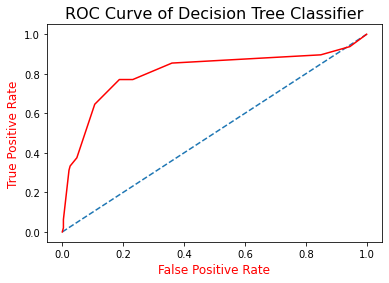

In [78]:
fpr, tpr, thresh = roc_curve(Y_test, probs_dtc)

plt.plot([0,1], [0,1], linestyle= '--')
plt.plot(fpr,tpr, color = 'red')
plt.title('ROC Curve of Decision Tree Classifier', fontsize = 16)
plt.xlabel('False Positive Rate', fontsize = 12, color = 'r')
plt.ylabel('True Positive Rate', fontsize = 12, color = 'r')
plt.show()

In [79]:
probs_rfc = rfc_clf.predict_proba(X_test)

In [80]:
probs_rfc = probs_rfc[:,1]

In [81]:
auc_rfc = roc_auc_score(Y_test, probs_rfc)
print(auc_rfc)

0.9353553921568628


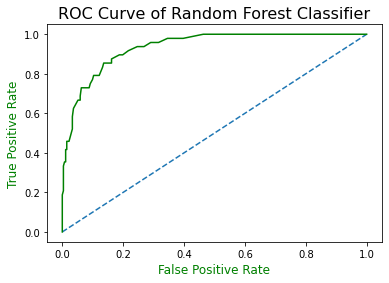

In [82]:
fpr, tpr, thresh = roc_curve(Y_test, probs_rfc)

plt.plot([0,1], [0,1], linestyle= '--')
plt.plot(fpr,tpr, color = 'green')
plt.title('ROC Curve of Random Forest Classifier', fontsize = 16)
plt.xlabel('False Positive Rate', fontsize = 12, color = 'g')
plt.ylabel('True Positive Rate', fontsize = 12, color = 'g')
plt.show()